# Detecting Plastic in Rivers


Read [SAHI](https://encord.com/blog/slicing-aided-hyper-inference-explained/https://encord.com/blog/slicing-aided-hyper-inference-explained/) for small object detection

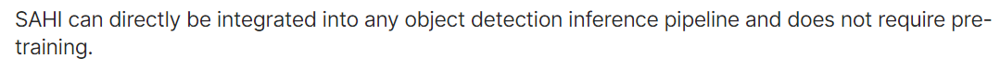

## Exploratory Analysis

We will be using two image datasets:

1. Kili's Plastic in River: specifically designed to segment plastic waste in rivers (Contains only bounding boxes)
2. TACO: general trash detection (bounding boxes and segmentation)

In [1]:
import matplotlib.pyplot as plt

Challenges

1. Which data format to use? 
    - arrow or traditional image storage
    - arrow is good for low end systems
    - for high end where all images can be in memory (COLAB) it wouldn't matter

### Plastic in river dataset

Loading arrow files

In [7]:
# datasets library
from datasets import load_dataset, Dataset

# dataset = load_dataset("arrow", data_dir="./Kili/")

data = Dataset.from_file("./Kili/train/data-00000-of-00008.arrow")

In [29]:
data

Dataset({
    features: ['image', 'litter'],
    num_rows: 426
})

In [15]:
data[300]

{'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=3840x2160 at 0x1CD15175AF0>,
 'litter': {'label': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
  'bbox': [[0.12541815638542175,
    0.7971259355545044,
    0.03784547746181488,
    0.0422329381108284],
   [0.8136777877807617,
    0.8776813745498657,
    0.034324970096349716,
    0.043797120451927185],
   [0.2398347109556198,
    0.8870664834976196,
    0.03784547746181488,
    0.037540387362241745],
   [0.3331282138824463,
    0.8119856715202332,
    0.02728394977748394,
    0.043797120451927185],
   [0.9888231158256531,
    0.8800276517868042,
    0.022003185003995895,
    0.0422329381108284],
   [0.2781202495098114,
    0.8831560015678406,
    0.026403822004795074,
    0.03284784033894539],
   [0.3788948357105255,
    0.8291916847229004,
    0.034324970096349716,
    0.025026926770806313],
   [0.24071484804153442,
    0.8698604702949524,
    0.032564714550971985,
    0.021898560225963593],
   [0.386815994977

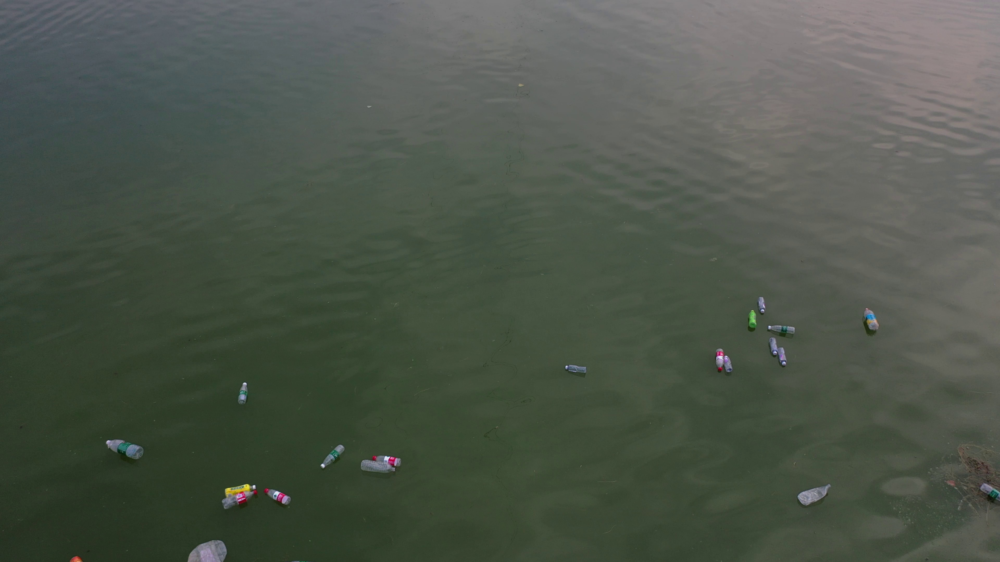

In [14]:
data[300]['image']

Augment kili dataset with TACO data 

Data stored in batch 1 to 15 in folders with COCO annotations

In [16]:
# loading one batch
from datasets import load_dataset

test = load_dataset("imagefolder", data_dir="TACO/data/batch_1/")

Resolving data files:   0%|          | 0/101 [00:00<?, ?it/s]

Extracting data files: 0it [00:00, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Dataset imagefolder downloaded and prepared to C:/Users/Ankush/.cache/huggingface/datasets/imagefolder/default-a7b4108b4a250b52/0.0.0/37fbb85cc714a338bea574ac6c7d0b5be5aff46c1862c1989b20e0771199e93f. Subsequent calls will reuse this data.


  0%|          | 0/1 [00:00<?, ?it/s]

In [31]:
test['train']

Dataset({
    features: ['image'],
    num_rows: 101
})

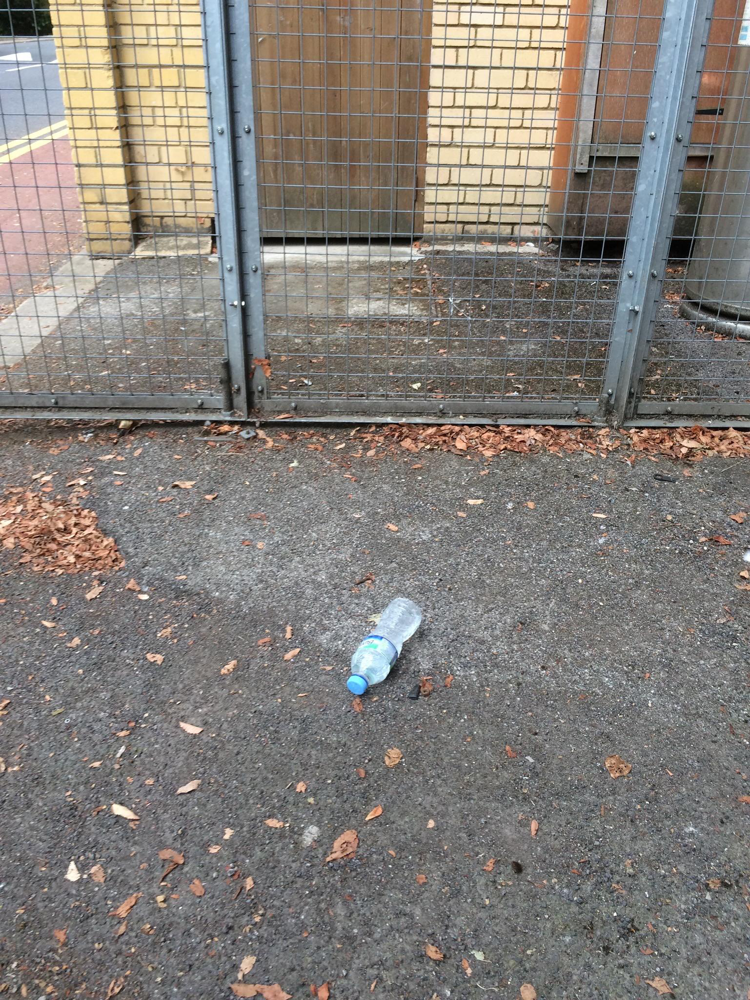

In [21]:
test['train'][0]['image']

Loading the annotations to match earlier format

In [24]:
import json

taco_annotations = json.load(open("TACO/data/annotations.json"))

In [33]:
# adding litter feature to dataset

data1 = test['train']

In [37]:
data.features['litter']

Sequence(feature={'label': ClassLabel(names=['PLASTIC_BAG', 'PLASTIC_BOTTLE', 'OTHER_PLASTIC_WASTE', 'NOT_PLASTIC_WASTE'], id=None), 'bbox': Sequence(feature=Value(dtype='float32', id=None), length=4, id=None)}, length=-1, id=None)

We will use COCO data format to save and merge datasets

- TACO is already in COCO format
- Need to conver kili dataset in Coco format

In [39]:
data[0]

{'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1280x720 at 0x1CD5B3D03A0>,
 'litter': {'label': [2, 2],
  'bbox': [[0.6937950849533081,
    0.17073695361614227,
    0.017922647297382355,
    0.011738809756934643],
   [0.5574886202812195,
    0.18079878389835358,
    0.021695835515856743,
    0.010061836801469326]]}}

In [40]:
from sahi.utils.coco import Coco, CocoCategory, CocoImage, CocoAnnotation
from sahi.utils.file import save_json

In [41]:
coco = Coco()

In [42]:
# adding 4 categories
# 0:"PLASTIC_BAG"
# 1:"PLASTIC_BOTTLE"
# 2:"OTHER_PLASTIC_WASTE"
# 3:"NOT_PLASTIC_WASTE"

coco.add_category(CocoCategory(id=0, name="Plastic_bag"))
coco.add_category(CocoCategory(id=1, name="Plastic_bottle"))
coco.add_category(CocoCategory(id=0, name="Plastic_other"))
coco.add_category(CocoCategory(id=0, name="not_plastic_waste"))

In [45]:
data[0]['image'].size # width, height

(1280, 720)

In [47]:
data[0]['litter']

{'label': [2, 2],
 'bbox': [[0.6937950849533081,
   0.17073695361614227,
   0.017922647297382355,
   0.011738809756934643],
  [0.5574886202812195,
   0.18079878389835358,
   0.021695835515856743,
   0.010061836801469326]]}

In [70]:
"file.arrow".count("arrow")

1

In [92]:
folders = ["train", "test", "validation"]
files += [f"Kili/{folders[2]}/{i}" for i in os.listdir(f"Kili/{folders[2]}/") if i.count(".arrow") == 1]
files

['Kili/train/data-00000-of-00008.arrow',
 'Kili/train/data-00001-of-00008.arrow',
 'Kili/train/data-00002-of-00008.arrow',
 'Kili/train/data-00003-of-00008.arrow',
 'Kili/train/data-00004-of-00008.arrow',
 'Kili/train/data-00005-of-00008.arrow',
 'Kili/train/data-00006-of-00008.arrow',
 'Kili/train/data-00007-of-00008.arrow',
 'Kili/test/data-00000-of-00001.arrow',
 'Kili/validation/data-00000-of-00001.arrow']

In [128]:
print(f"{1:06}", end=f"\r{' '*100}\r")
# print(" "*100, end='\r')
print("2")

2                                                                                                   


In [156]:
CocoImage(file_name="i.jpg",height=1,width=1).annotations

[]

In [192]:
coco = Coco()
categories = {
    0: "Plastic_bag",
    1: "Plastic_bottle",
    2 : "Plastic_other",
    3: "not_plastic_waste"
}
coco.add_category(CocoCategory(id=0, name="Plastic_bag"))
coco.add_category(CocoCategory(id=1, name="Plastic_bottle"))
coco.add_category(CocoCategory(id=2, name="Plastic_other"))
coco.add_category(CocoCategory(id=3, name="not_plastic_waste"))

batch_count = 1
image_count = 1

for file in files:
    # loading arrow file
    data = Dataset.from_file(file)
    
    # creating batch directory
    os.makedirs(os.path.join(OUTPUT_KILI,
                    f"batch_{batch_count}"), exist_ok=True)
    for obj in data:
        image = obj['image']
        litter = obj['litter']
        labels = litter['label']
        bboxes = litter['bbox']
        
        # saving image
        img_path = os.path.join(OUTPUT_KILI, 
                                f"batch_{batch_count}", 
                                f"{image_count:06}.jpg")
        image.save(img_path)
        
        # building coco annotations
        rel_path = f"batch_{batch_count}/{image_count:06}.jpg"
        
        width, height = image.size
        coco_image = CocoImage(file_name=rel_path,
                               height=height,
                               width=width)
        
        # if len(labels) == 0:
        #     coco_image.add_annotation(
        #     CocoAnnotation())
            
        for i, category in enumerate(labels):
            coco_image.add_annotation(
                CocoAnnotation(
                    bbox=bboxes[i],
                    category_id=category,
                    category_name=categories[category]
                )
            )
            
        coco.add_image(coco_image)        
        print(f"\r{' '*100}\r", end="")
        print(f"f{rel_path} #Image: {image_count}", end="")
        image_count += 1
    batch_count += 1

save_json(data=coco.json, save_path=os.path.join(OUTPUT_KILI,
                                                "annotations.json"))

fbatch_10/004259.jpg #Image: 4259                                                                   

In [81]:
data = Dataset.from_file(files[0])

In [83]:
OUTPUT_KILI = 'KILI_COCO'

In [84]:
!mkdir KILI_COCO

In [82]:
data[0]

{'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1280x720 at 0x1CD6490DF40>,
 'litter': {'label': [2, 2],
  'bbox': [[0.6937950849533081,
    0.17073695361614227,
    0.017922647297382355,
    0.011738809756934643],
   [0.5574886202812195,
    0.18079878389835358,
    0.021695835515856743,
    0.010061836801469326]]}}

Task 1 save all images as jpg

In [90]:
data[0]['image'].save("im1.jpg")

In [86]:
for obj in data:
    coco_image = CocoImage()

{'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=1280x720 at 0x1CD68FF99D0>, 'litter': {'label': [2, 2], 'bbox': [[0.6937950849533081, 0.17073695361614227, 0.017922647297382355, 0.011738809756934643], [0.5574886202812195, 0.18079878389835358, 0.021695835515856743, 0.010061836801469326]]}}


# Images come in all different sizes

How to normalize the database and apply transforms to preserve object detection and segmentation masks

Traditionally augmenting and transforming data worked only for classification tasks, the beta [PyTorch API](https://pytorch.org/blog/extending-torchvisions-transforms-to-object-detection-segmentation-and-video-tasks/) augments this process for bonding boxes and segmentations

<div class="alert alert-info">
Reason why the data normalization (cleaning) was applied as such for every transform
</div>

How to load the datasets

https://www.kaggle.com/code/caydengwee/actual-taco-litter-detection

In [170]:
!pip install pycocotools

  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
    Preparing wheel metadata: started
    Preparing wheel metadata: finished with status 'done'
  Created wheel for pycocotools: filename=pycocotools-2.0.6-cp39-cp39-win_amd64.whl size=77432 sha256=a1669a1649f37a932391702354aceb366dd4e8db4dc68aa82d450c02c3bcf372
  Stored in directory: c:\users\ankush\appdata\local\pip\cache\wheels\2f\58\25\e78f1f766e904a9071266661d20d0bc6644df86bcd160aba11
Successfully built pycocotools


In [171]:
from pycocotools.coco import COCO

In [193]:
try1 = COCO(annotation_file="KILI_COCO/annotations.json")

loading annotations into memory...
Done (t=0.10s)
creating index...
index created!


In [194]:
len(try1.getImgIds())

4259

In [195]:
try1.loadCats(try1.getCatIds())

[{'id': 0, 'name': 'Plastic_bag', 'supercategory': 'Plastic_bag'},
 {'id': 1, 'name': 'Plastic_bottle', 'supercategory': 'Plastic_bottle'},
 {'id': 2, 'name': 'Plastic_other', 'supercategory': 'Plastic_other'},
 {'id': 3, 'name': 'not_plastic_waste', 'supercategory': 'not_plastic_waste'}]

In [180]:
len(try1.getAnnIds())

14917

In [183]:
try1.loadAnns([1,2])

[{'iscrowd': 0,
  'image_id': 1,
  'bbox': [0.6937950849533081,
   0.17073695361614227,
   0.017922647297382355,
   0.011738809756934643],
  'segmentation': [],
  'category_id': 2,
  'id': 1,
  'area': 0},
 {'iscrowd': 0,
  'image_id': 1,
  'bbox': [0.5574886202812195,
   0.18079878389835358,
   0.021695835515856743,
   0.010061836801469326],
  'segmentation': [],
  'category_id': 2,
  'id': 2,
  'area': 0}]

trying to load dataset TACO

In [184]:
taco = COCO(annotation_file="TACO/data/annotations.json")

loading annotations into memory...
Done (t=0.07s)
creating index...
index created!


In [187]:
len(taco.getCatIds())

60

In [230]:
[(t["id"], t["supercategory"], t['name']) for t in taco.loadCats(taco.getCatIds())]

[(0, 'Aluminium foil', 'Aluminium foil'),
 (1, 'Battery', 'Battery'),
 (2, 'Blister pack', 'Aluminium blister pack'),
 (3, 'Blister pack', 'Carded blister pack'),
 (4, 'Bottle', 'Other plastic bottle'),
 (5, 'Bottle', 'Clear plastic bottle'),
 (6, 'Bottle', 'Glass bottle'),
 (7, 'Bottle cap', 'Plastic bottle cap'),
 (8, 'Bottle cap', 'Metal bottle cap'),
 (9, 'Broken glass', 'Broken glass'),
 (10, 'Can', 'Food Can'),
 (11, 'Can', 'Aerosol'),
 (12, 'Can', 'Drink can'),
 (13, 'Carton', 'Toilet tube'),
 (14, 'Carton', 'Other carton'),
 (15, 'Carton', 'Egg carton'),
 (16, 'Carton', 'Drink carton'),
 (17, 'Carton', 'Corrugated carton'),
 (18, 'Carton', 'Meal carton'),
 (19, 'Carton', 'Pizza box'),
 (20, 'Cup', 'Paper cup'),
 (21, 'Cup', 'Disposable plastic cup'),
 (22, 'Cup', 'Foam cup'),
 (23, 'Cup', 'Glass cup'),
 (24, 'Cup', 'Other plastic cup'),
 (25, 'Food waste', 'Food waste'),
 (26, 'Glass jar', 'Glass jar'),
 (27, 'Lid', 'Plastic lid'),
 (28, 'Lid', 'Metal lid'),
 (29, 'Other plasti

# Merging two datasets

Creating a consolidated raw dataset, with collapsed categories. No transforms or cleaning to be applied at this stage

With one annotation file, by merging raw json annotations

In [68]:
import json

KILI = "KILI_COCO"
TACO = "TACO"

In [204]:
kili_json = json.load(open(f"{KILI}/annotations.json", "r"))
taco_json = json.load(open(f"{TACO}/data/annotations.json", "r"))

In [218]:
kili_json["annotations"][0]

{'iscrowd': 0,
 'image_id': 1,
 'bbox': [0.6937950849533081,
  0.17073695361614227,
  0.017922647297382355,
  0.011738809756934643],
 'segmentation': [],
 'category_id': 2,
 'id': 1,
 'area': 0}

- correcting bounding box format but manual testing
- manual encoding to categories
- merging to one database

In [259]:
# merging databases

cocom = Coco(name="Plastic detection dataset")

# counter 

images_done = 0

# Final categories
final_classes = ["Plastic_bag", "Plastic_bottle", "Plastic_other",
                "Not_Plastic_waste"]

for i, label in enumerate(final_classes):
    cocom.add_category(CocoCategory(id=i, name=label))

# kili database

kili_categories = {
    0: {"from": "Plastic_bag", "to": (0, "Plastic_bag")},
    1: {"from": "Plastic_bottle", "to": (1, "Plastic_bottle")},
    2 : {"from": "Plastic_other", "to": (2, "Plastic_other")},
    3: {"from": "not_plastic_waste", "to": (3, "Not_Plastic_waste")}
}

annotation_id = 0
image_id = kili_json['images'][0]["id"]

def fix_box_format_k(bounds, height, width):
    """
    c_x,c_y,  b_w, b_h percentage to pixel values
    """
    c_x = bounds[0]*width
    c_y = bounds[1]*height
    b_w = bounds[2]*width
    b_h = bounds[3]*height
    
    return [round(i,0) for i in [c_x - b_w/2,
           c_y - b_h/2,
           b_w,
           b_h]]
    
    

while image_id <= len(kili_json['images']):
    image = kili_json['images'][image_id-1]
    coco_image = CocoImage(file_name=f"{KILI}/{image['file_name']}",
                          height=image['height'],
                           width=image['width'])
    
    while (annotation_id < len(kili_json['annotations'])
           and
           kili_json['annotations'][annotation_id]["image_id"] == image_id ):
        annotation = kili_json['annotations'][annotation_id]
        if len(annotation["bbox"]) == 0:
            annotation_id += 1
            continue
        coco_image.add_annotation(
            # converting to pixels
            CocoAnnotation(bbox=fix_box_format_k(annotation['bbox'], height, width),
                           category_id=(
                               kili_categories
                               [annotation["category_id"]]
                               ["to"][0]),
                          category_name=(
                               kili_categories
                               [annotation["category_id"]]
                               ["to"][1])))
        annotation_id += 1
        # print(f"Annot: {annotation_id}", end="\r")
    image_id += 1
    cocom.add_image(coco_image)
    
    # stats
    images_done += 1
    print(f"Images : {images_done}", end="\r")
    

# for TACO dataset
ft = lambda i: {"to":(i, final_classes[i])}

taco_categories = {
    0: ft(3),
    1: ft(3),
    2: ft(2),
    3: ft(2),
    4: ft(1),
    5: ft(1),
    6: ft(3),
    7: ft(2),
    8: ft(2),
    9: ft(3),
    10: ft(3),
    11: ft(3),
    12: ft(3),
    13: ft(3),
    14: ft(3),
    15: ft(3),
    16: ft(3),
    17: ft(3),
    18: ft(3),
    19: ft(3),
    20: ft(3),
    21: ft(2),
    22: ft(3),
    23: ft(3),
    24: ft(2),
    25: ft(3),
    26: ft(3),
    27: ft(2),
    28: ft(3),
    29: ft(2),
    30: ft(3),
    31: ft(3),
    32: ft(3),
    33: ft(3),
    34: ft(3),
    35: ft(3),
    36: ft(2),
    37: ft(2),
    38: ft(0),
    39: ft(2),
    40: ft(0),
    41: ft(0),
    42: ft(2),
    43: ft(2),
    44: ft(2),
    45: ft(2),
    46: ft(2),
    47: ft(2),
    48: ft(2),
    49: ft(2),
    50: ft(3),
    51: ft(3),
    52: ft(3),
    53: ft(3),
    54: ft(2),
    55: ft(2),
    56: ft(3),
    57: ft(3),
    58: ft(3),
    59: ft(3)
}

annotation_id = 0
image_id = taco_json['images'][0]["id"]

while image_id < len(taco_json['images']):
    image = taco_json['images'][image_id]
    coco_image = CocoImage(file_name=f"{TACO}/data/{image['file_name']}",
                          height=image['height'],
                           width=image['width'])
    
    while (annotation_id < len(taco_json['annotations'])
           and
           taco_json['annotations'][annotation_id]["image_id"] == image_id ):
        annotation = taco_json['annotations'][annotation_id]
        if len(annotation["bbox"]) == 0:
            annotation_id += 1
            continue
        coco_image.add_annotation(
            CocoAnnotation(bbox=annotation['bbox'],
                           segmentation=annotation["segmentation"],
                           category_id=(
                               taco_categories
                               [annotation["category_id"]]
                               ["to"][0]),
                          category_name=(
                               taco_categories
                               [annotation["category_id"]]
                               ["to"][1])))
        annotation_id += 1
    image_id += 1
    cocom.add_image(coco_image)
    
    # stats
    images_done += 1
    print(f"Images : {images_done}", end="\r")

save_json(cocom.json, save_path="full_annotations.json")

class sizes and baseline model, how well different examples do

In [14]:
def ft(x):
    return  ["Plastic_bag", "Plastic_bottle", "Plastic_other", "Not_Plastic_waste"][x]
        

taco_categories = {
    0: ft(3),
    1: ft(3),
    2: ft(2),
    3: ft(2),
    4: ft(1),
    5: ft(1),
    6: ft(3),
    7: ft(2),
    8: ft(2),
    9: ft(3),
    10: ft(3),
    11: ft(3),
    12: ft(3),
    13: ft(3),
    14: ft(3),
    15: ft(3),
    16: ft(3),
    17: ft(3),
    18: ft(3),
    19: ft(3),
    20: ft(3),
    21: ft(2),
    22: ft(3),
    23: ft(3),
    24: ft(2),
    25: ft(3),
    26: ft(3),
    27: ft(2),
    28: ft(3),
    29: ft(2),
    30: ft(3),
    31: ft(3),
    32: ft(3),
    33: ft(3),
    34: ft(3),
    35: ft(3),
    36: ft(2),
    37: ft(2),
    38: ft(0),
    39: ft(2),
    40: ft(0),
    41: ft(0),
    42: ft(2),
    43: ft(2),
    44: ft(2),
    45: ft(2),
    46: ft(2),
    47: ft(2),
    48: ft(2),
    49: ft(2),
    50: ft(3),
    51: ft(3),
    52: ft(3),
    53: ft(3),
    54: ft(2),
    55: ft(2),
    56: ft(3),
    57: ft(3),
    58: ft(3),
    59: ft(3)
}

In [20]:
cats = {}

for i in taco["categories"]:
    cats[i["id"]] = i["name"]
    
cats

{0: 'Aluminium foil',
 1: 'Battery',
 2: 'Aluminium blister pack',
 3: 'Carded blister pack',
 4: 'Other plastic bottle',
 5: 'Clear plastic bottle',
 6: 'Glass bottle',
 7: 'Plastic bottle cap',
 8: 'Metal bottle cap',
 9: 'Broken glass',
 10: 'Food Can',
 11: 'Aerosol',
 12: 'Drink can',
 13: 'Toilet tube',
 14: 'Other carton',
 15: 'Egg carton',
 16: 'Drink carton',
 17: 'Corrugated carton',
 18: 'Meal carton',
 19: 'Pizza box',
 20: 'Paper cup',
 21: 'Disposable plastic cup',
 22: 'Foam cup',
 23: 'Glass cup',
 24: 'Other plastic cup',
 25: 'Food waste',
 26: 'Glass jar',
 27: 'Plastic lid',
 28: 'Metal lid',
 29: 'Other plastic',
 30: 'Magazine paper',
 31: 'Tissues',
 32: 'Wrapping paper',
 33: 'Normal paper',
 34: 'Paper bag',
 35: 'Plastified paper bag',
 36: 'Plastic film',
 37: 'Six pack rings',
 38: 'Garbage bag',
 39: 'Other plastic wrapper',
 40: 'Single-use carrier bag',
 41: 'Polypropylene bag',
 42: 'Crisp packet',
 43: 'Spread tub',
 44: 'Tupperware',
 45: 'Disposable 

In [32]:
for i, j in taco_categories.items():
    if j == "Not_Plastic_waste":
        print(cats[i])

Aluminium foil
Battery
Glass bottle
Broken glass
Food Can
Aerosol
Drink can
Toilet tube
Other carton
Egg carton
Drink carton
Corrugated carton
Meal carton
Pizza box
Paper cup
Foam cup
Glass cup
Food waste
Glass jar
Metal lid
Magazine paper
Tissues
Wrapping paper
Normal paper
Paper bag
Plastified paper bag
Pop tab
Rope & strings
Scrap metal
Shoe
Paper straw
Styrofoam piece
Unlabeled litter
Cigarette


In [16]:
for i,k in taco_categories:

{0: 'Not_Plastic_waste',
 1: 'Not_Plastic_waste',
 2: 'Plastic_other',
 3: 'Plastic_other',
 4: 'Plastic_bottle',
 5: 'Plastic_bottle',
 6: 'Not_Plastic_waste',
 7: 'Plastic_other',
 8: 'Plastic_other',
 9: 'Not_Plastic_waste',
 10: 'Not_Plastic_waste',
 11: 'Not_Plastic_waste',
 12: 'Not_Plastic_waste',
 13: 'Not_Plastic_waste',
 14: 'Not_Plastic_waste',
 15: 'Not_Plastic_waste',
 16: 'Not_Plastic_waste',
 17: 'Not_Plastic_waste',
 18: 'Not_Plastic_waste',
 19: 'Not_Plastic_waste',
 20: 'Not_Plastic_waste',
 21: 'Plastic_other',
 22: 'Not_Plastic_waste',
 23: 'Not_Plastic_waste',
 24: 'Plastic_other',
 25: 'Not_Plastic_waste',
 26: 'Not_Plastic_waste',
 27: 'Plastic_other',
 28: 'Not_Plastic_waste',
 29: 'Plastic_other',
 30: 'Not_Plastic_waste',
 31: 'Not_Plastic_waste',
 32: 'Not_Plastic_waste',
 33: 'Not_Plastic_waste',
 34: 'Not_Plastic_waste',
 35: 'Not_Plastic_waste',
 36: 'Plastic_other',
 37: 'Plastic_other',
 38: 'Plastic_bag',
 39: 'Plastic_other',
 40: 'Plastic_bag',
 41: '

# Visualizations

Classes
- What are the distribution of classes per instance in both datasets
- Table of mapping the categories in combined dataset
- Combined dataset instance distribution

Type of images
- sizes of images

Instances
- where are instances present in first and seconds datasets (after cleaning)
- where are the present in combined dataset

In [2]:
from skimage import io
import matplotlib.pyplot as plt
from matplotlib import gridspec
import json

In [3]:
kili = json.load(open("KILI_COCO/annotations.json"))
taco = json.load(open("TACO/data/annotations.json"))
combined = json.load(open("full_annotations.json"))

### Classes information for each dataset

In [3]:
data = taco

In [5]:
def getCategoryCounts(data, name="name"):
    counter = {}
    categories = data["categories"]

    for image in data["annotations"]:
        category = image["category_id"]
        category = categories[category][name]
        counter[category] = counter.get(category, 0) + 1

    return counter

In [11]:
data = taco

counter = {}
categories = data["categories"]

for cat in categories:
    counter[cat["supercategory"]] = counter.get(cat["supercategory"], []) + [cat["name"]]

In [13]:
counter

{'Aluminium foil': ['Aluminium foil'],
 'Battery': ['Battery'],
 'Blister pack': ['Aluminium blister pack', 'Carded blister pack'],
 'Bottle': ['Other plastic bottle', 'Clear plastic bottle', 'Glass bottle'],
 'Bottle cap': ['Plastic bottle cap', 'Metal bottle cap'],
 'Broken glass': ['Broken glass'],
 'Can': ['Food Can', 'Aerosol', 'Drink can'],
 'Carton': ['Toilet tube',
  'Other carton',
  'Egg carton',
  'Drink carton',
  'Corrugated carton',
  'Meal carton',
  'Pizza box'],
 'Cup': ['Paper cup',
  'Disposable plastic cup',
  'Foam cup',
  'Glass cup',
  'Other plastic cup'],
 'Food waste': ['Food waste'],
 'Glass jar': ['Glass jar'],
 'Lid': ['Plastic lid', 'Metal lid'],
 'Other plastic': ['Other plastic'],
 'Paper': ['Magazine paper', 'Tissues', 'Wrapping paper', 'Normal paper'],
 'Paper bag': ['Paper bag', 'Plastified paper bag'],
 'Plastic bag & wrapper': ['Plastic film',
  'Six pack rings',
  'Garbage bag',
  'Other plastic wrapper',
  'Single-use carrier bag',
  'Polypropylen

In [8]:
getCategoryCounts(taco, name="supercategory")

{'Bottle': 439,
 'Carton': 251,
 'Bottle cap': 289,
 'Can': 273,
 'Pop tab': 99,
 'Cup': 192,
 'Plastic bag & wrapper': 850,
 'Styrofoam piece': 112,
 'Other plastic': 273,
 'Plastic container': 72,
 'Paper': 148,
 'Lid': 87,
 'Straw': 161,
 'Paper bag': 27,
 'Broken glass': 138,
 'Plastic utensils': 37,
 'Glass jar': 6,
 'Food waste': 8,
 'Squeezable tube': 7,
 'Shoe': 7,
 'Aluminium foil': 62,
 'Unlabeled litter': 517,
 'Blister pack': 7,
 'Battery': 2,
 'Rope & strings': 29,
 'Cigarette': 667,
 'Scrap metal': 20,
 'Plastic glooves': 4}

In [67]:
sorted(list(c_counts.items()), key=lambda x: x[1], reverse=True)

[('Plastic_bottle', 7930),
 ('Plastic_other', 3835),
 ('Not_Plastic_waste', 1911),
 ('Plastic_bag', 1509)]

In [47]:
def getSortedItems(data):
    ls = list(data.items())
    ls = sorted(ls, key=lambda x: x[1], reverse=True)
    return [x[0] for x in ls], [x[1] for x in ls]

In [5]:
getCategoryCounts(combined)

{'Plastic_other': 3835,
 'Plastic_bottle': 7930,
 'Not_Plastic_waste': 1911,
 'Plastic_bag': 1509}

In [6]:
getCategoryCounts(kili), getCategoryCounts(taco)

({'Plastic_other': 3763,
  'Plastic_bottle': 7915,
  'not_plastic_waste': 1737,
  'Plastic_bag': 1502},
 {'Glass bottle': 104,
  'Meal carton': 30,
  'Other carton': 93,
  'Clear plastic bottle': 285,
  'Plastic bottle cap': 209,
  'Drink can': 229,
  'Food Can': 34,
  'Other plastic bottle': 50,
  'Pop tab': 99,
  'Aerosol': 10,
  'Glass cup': 6,
  'Other plastic wrapper': 260,
  'Styrofoam piece': 112,
  'Plastic film': 451,
  'Other plastic': 273,
  'Drink carton': 45,
  'Metal bottle cap': 80,
  'Disposable food container': 38,
  'Normal paper': 82,
  'Paper cup': 67,
  'Single-use carrier bag': 61,
  'Tissues': 42,
  'Toilet tube': 5,
  'Crisp packet': 39,
  'Plastic lid': 77,
  'Metal lid': 10,
  'Egg carton': 11,
  'Plastic straw': 157,
  'Paper bag': 27,
  'Disposable plastic cup': 104,
  'Broken glass': 138,
  'Plastic utensils': 37,
  'Glass jar': 6,
  'Food waste': 8,
  'Squeezable tube': 7,
  'Spread tub': 9,
  'Shoe': 7,
  'Garbage bag': 31,
  'Aluminium foil': 62,
  'Six 

In [7]:
sum(getCategoryCounts(kili).values()), sum(getCategoryCounts(taco).values()), sum(getCategoryCounts(combined).values())

(14917, 4784, 15185)

<BarContainer object of 3 artists>

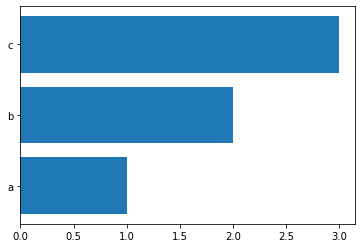

In [14]:
plt.barh(['a','b','c'], [1,2,3], )

In [17]:
(k_counts.values())

dict_values([3763, 7915, 1737, 1502])

In [48]:
k_is, k_vals = getSortedItems(getCategoryCounts(kili))

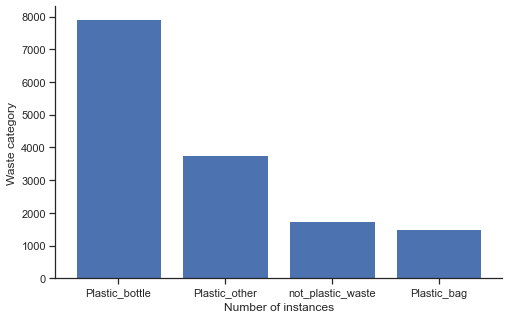

In [50]:
plt.figure(figsize=(8, 5))
plt.xlabel("Number of instances")
plt.ylabel("Waste category")
seaborn.despine(ax=plt.gca(), offset=0);
plt.bar(k_is, k_vals)
plt.savefig("Figs/fig2")
# order according to maximum count categories

<BarContainer object of 59 artists>

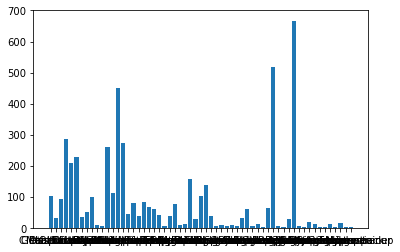

In [21]:
t_counts = getCategoryCounts(taco)
# fig, ax = plt.subplots(2, 1)
# ax[0].bar(k_counts.keys(), k_counts.values())

plt.bar(t_counts.keys(), t_counts.values())

In [11]:
c_counts, k_counts
# why are the counts same, recheck

({'Plastic_other': 3835,
  'Plastic_bottle': 7930,
  'Not_Plastic_waste': 1911,
  'Plastic_bag': 1509},
 {'Plastic_other': 3763,
  'Plastic_bottle': 7915,
  'not_plastic_waste': 1737,
  'Plastic_bag': 1502})

<BarContainer object of 4 artists>

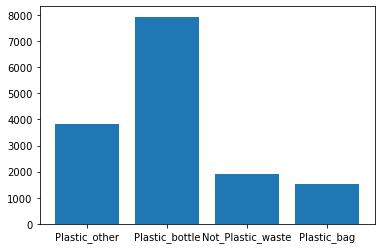

In [22]:
c_counts = getCategoryCounts(combined)
# fig, ax = plt.subplots(2, 1)
# ax[0].bar(k_counts.keys(), k_counts.values())

plt.bar(c_counts.keys(), c_counts.values())

In [40]:
import seaborn
seaborn.set(style='ticks')

C:\Users\Ankush\AppData\Local\Temp\ipykernel_38420\1577725261.py:19: UserWarning: FixedFormatter should only be used together with FixedLocator
  a0.set_xticklabels(t_is, rotation=90)
C:\Users\Ankush\AppData\Local\Temp\ipykernel_38420\1577725261.py:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  a1.set_xticklabels(k_is,rotation=90);


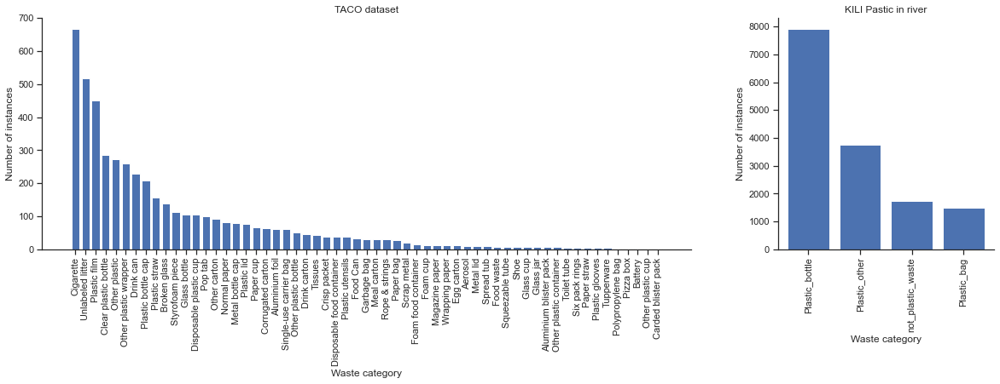

In [155]:
#combined chart 2

t_is, t_cs = getSortedItems(getCategoryCounts(taco))
k_is, k_cs = getSortedItems(getCategoryCounts(kili))

f, (a0, a1) = plt.subplots(1, 2, gridspec_kw={
                           'width_ratios': [3, 1]})

# f.figure(figsize=(15, 5))
f.set_figheight(5)
f.set_figwidth(20)

# plt.subplot(1, 2, 1)
a0.title.set_text("TACO dataset")
a0.set_ylabel("Number of instances")
a0.set_xlabel("Waste category")
a0.bar(t_is, t_cs)
seaborn.despine(ax=a0, offset=0);
a0.set_xticklabels(t_is, rotation=90)


# plt.subplot(1, 2, 2)
a1.title.set_text("KILI Pastic in river")
a1.set_ylabel("Number of instances")
a1.set_xlabel("Waste category")
a1.bar(k_is, k_cs)
seaborn.despine(ax=a1, offset=0);
a1.set_xticklabels(k_is,rotation=90);



In [156]:
f.savefig("./Figs/fig1.png", bbox_inches='tight')

TypeError: 'Text' object is not callable

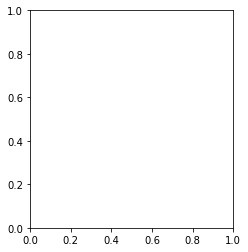

In [47]:
spec = gridspec.GridSpec(ncols=2, nrows=1,
                         width_ratios=[2, 1])

fig = plt.figure()

a0 = fig.add_subplot(spec[0])
a0.title("TACO dataset")
a0.xlabel("Number of instances")
a0.ylabel("Waste category")
a0.bar(list(t_counts.keys()), list(t_counts.values()))
a0.xticks(rotation=90)

## Size of images

In [140]:
from fractions import Fraction

In [142]:
f = Fraction(8, 2)

In [144]:
f.numerator, f.denominator

(4, 1)

In [145]:
def getAspects(data):
    dim_count = {}
    
    for image in data["images"]:
        h, w = image["height"], image["width"]
        f = Fraction(w, h)
        dim_count[f"{f.numerator}:{f.denominator}"] = dim_count.get(f"{f.numerator}:{f.denominator}", 0) + 1
        
    return dim_count

C:\Users\Ankush\AppData\Local\Temp\ipykernel_38420\1177225823.py:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  a0.set_xticklabels(t_is, rotation=90)
C:\Users\Ankush\AppData\Local\Temp\ipykernel_38420\1177225823.py:26: UserWarning: FixedFormatter should only be used together with FixedLocator
  a1.set_xticklabels(k_is,rotation=90);


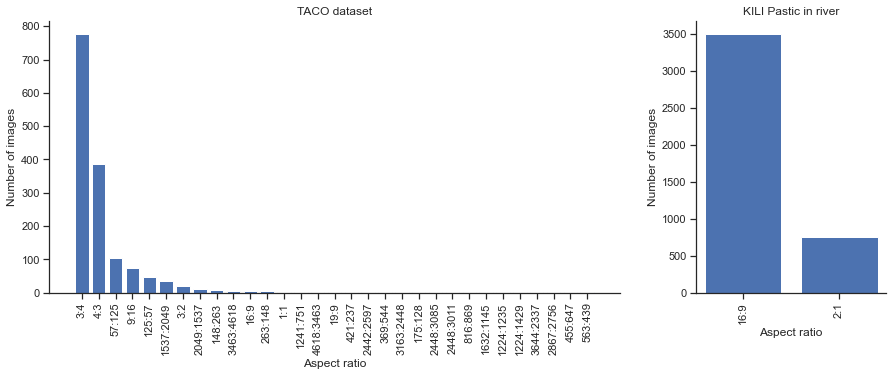

In [161]:
t_is, t_cs = getSortedItems(getAspects(taco))
k_is, k_cs = getSortedItems(getAspects(kili))

f, (a0, a1) = plt.subplots(1, 2, gridspec_kw={
                           'width_ratios': [3, 1]})

# f.figure(figsize=(15, 5))
f.set_figheight(5)
f.set_figwidth(15)

# plt.subplot(1, 2, 1)
a0.title.set_text("TACO dataset")
a0.set_ylabel("Number of images")
a0.set_xlabel("Aspect ratio")
a0.bar(t_is, t_cs)
seaborn.despine(ax=a0, offset=0);
a0.set_xticklabels(t_is, rotation=90)


# plt.subplot(1, 2, 2)
a1.title.set_text("KILI Pastic in river")
a1.set_ylabel("Number of images")
a1.set_xlabel("Aspect ratio")
a1.bar(k_is, k_cs)
seaborn.despine(ax=a1, offset=0);
a1.set_xticklabels(k_is,rotation=90);
plt.savefig("Figs/fig5.png", bbox_inches="tight")

<Figure size 432x288 with 0 Axes>

In [53]:
def getDimesions(data):
    dim_count = {}
    max_h = 0
    max_w = 0
    
    for image in data["images"]:
        h, w = image["height"], image["width"]
        dim_count[(h, w)] = dim_count.get((h, w), 0) + 1
        
        if max_h < h:
            max_h = h
        if max_w < w:
            max_w = w

    return dim_count, max_h, max_w

In [13]:
getDimesions(kili)

({(720, 1280): 2948,
  (640, 1280): 759,
  (1080, 1920): 499,
  (1440, 2560): 27,
  (2160, 3840): 26},
 2160,
 3840)

In [14]:
getDimesions(taco)

({(2049, 1537): 35,
  (1537, 2049): 12,
  (2448, 3264): 271,
  (3264, 2448): 499,
  (751, 1241): 1,
  (4000, 1824): 105,
  (1824, 4000): 46,
  (4000, 3000): 2,
  (4000, 6000): 20,
  (4128, 2322): 7,
  (3463, 4618): 1,
  (4618, 3463): 5,
  (4160, 3120): 84,
  (4608, 3456): 1,
  (4032, 3024): 146,
  (3024, 4032): 16,
  (5312, 2988): 43,
  (2340, 4160): 4,
  (3264, 1836): 1,
  (2988, 5312): 1,
  (4128, 3096): 1,
  (3120, 4160): 69,
  (3968, 2976): 6,
  (2976, 3968): 1,
  (2160, 4560): 1,
  (3000, 4000): 1,
  (4208, 2368): 9,
  (2368, 4208): 5,
  (2016, 1512): 1,
  (3456, 3456): 1,
  (474, 842): 1,
  (2048, 1536): 27,
  (1536, 2048): 6,
  (2597, 2442): 1,
  (3264, 2214): 1,
  (2448, 3163): 1,
  (1408, 1925): 1,
  (3085, 2448): 1,
  (3011, 2448): 1,
  (2607, 2448): 1,
  (2290, 3264): 1,
  (2470, 2448): 1,
  (2858, 2448): 1,
  (1968, 2624): 14,
  (2760, 3680): 5,
  (2337, 3644): 1,
  (2756, 2867): 1,
  (3235, 2275): 1,
  (2195, 2815): 1,
  (1280, 960): 1,
  (2448, 2448): 2,
  (960, 1280): 2,

In [15]:
getDimesions(combined)

({(720, 1280): 2948,
  (640, 1280): 759,
  (1080, 1920): 499,
  (1440, 2560): 27,
  (2160, 3840): 26,
  (2049, 1537): 35,
  (1537, 2049): 12,
  (2448, 3264): 271,
  (3264, 2448): 499,
  (751, 1241): 1,
  (4000, 1824): 105,
  (1824, 4000): 46,
  (4000, 3000): 2,
  (4000, 6000): 20,
  (4128, 2322): 7,
  (3463, 4618): 1,
  (4618, 3463): 5,
  (4160, 3120): 84,
  (4608, 3456): 1,
  (4032, 3024): 146,
  (3024, 4032): 16,
  (5312, 2988): 43,
  (2340, 4160): 4,
  (3264, 1836): 1,
  (2988, 5312): 1,
  (4128, 3096): 1,
  (3120, 4160): 69,
  (3968, 2976): 6,
  (2976, 3968): 1,
  (2160, 4560): 1,
  (3000, 4000): 1,
  (4208, 2368): 9,
  (2368, 4208): 5,
  (2016, 1512): 1,
  (3456, 3456): 1,
  (474, 842): 1,
  (2048, 1536): 27,
  (1536, 2048): 6,
  (2597, 2442): 1,
  (3264, 2214): 1,
  (2448, 3163): 1,
  (1408, 1925): 1,
  (3085, 2448): 1,
  (3011, 2448): 1,
  (2607, 2448): 1,
  (2290, 3264): 1,
  (2470, 2448): 1,
  (2858, 2448): 1,
  (1968, 2624): 14,
  (2760, 3680): 5,
  (2337, 3644): 1,
  (2756, 

Map the image sizes nicer somehow?  
largest image and keep overlaying?

In [16]:
from matplotlib.patches import Rectangle
from math import ceil

In [107]:
def drawBoxes(data):
    counts, max_h, max_w = getDimesions(data)

    ax = plt.gca()

    ax.add_patch(Rectangle((0,0),max_w, max_h,facecolor='#0000ff00'))
    ax.set_xlim(0, max_w)
    ax.set_ylim(0, max_h)
    total = sum(counts.values())

    for (h, w), n in counts.items():
        # alpha = f"{hex(ceil(n/total*255))[2:]:0>2}"
        # alpha = f"{ceil(n/total*100):0>2}"
        alpha = n/total
        x, y = (max_w-w)/2, (max_h-h)/2
        ax.add_patch(Rectangle((x,y), 
                     w,
                     h,
                     facecolor="#5471AB",
                    # edgecolor="#000000",
                    alpha=alpha))
        
    plt.xlabel("Width in pixels")
    plt.ylabel("Height in pixels")
    seaborn.despine(ax=ax, offset=0);
    # plt.show()

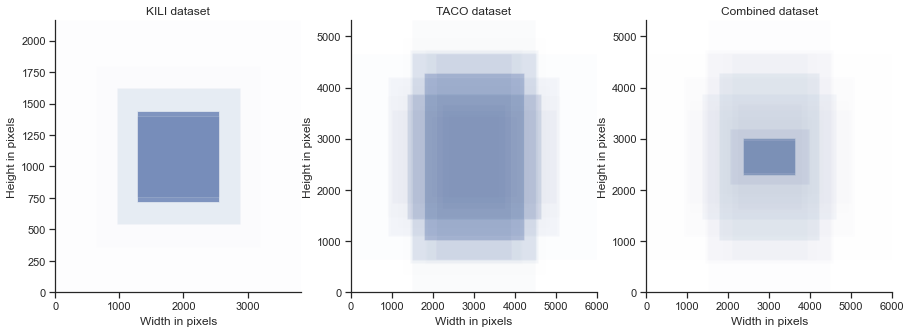

In [108]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title("KILI dataset")
drawBoxes(kili);

plt.subplot(1, 3, 2)
plt.title("TACO dataset")
drawBoxes(taco);

plt.subplot(1, 3, 3)
plt.title("Combined dataset")
drawBoxes(combined)

# plt.savefig("Figs/fig3.png", bbox_inches="tight")

<Figure size 720x360 with 0 Axes>

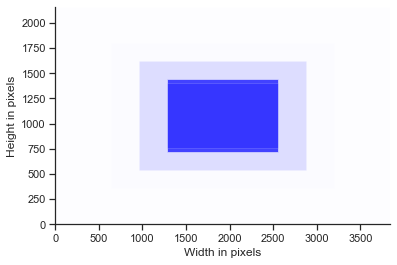

In [72]:
plt.figure(figsize=(10, 5))
drawBoxes(kili);

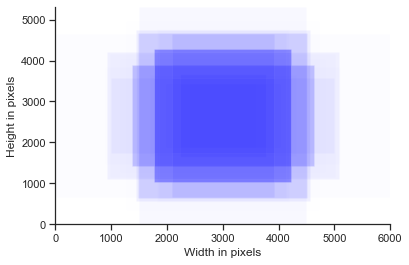

In [73]:
drawBoxes(taco)

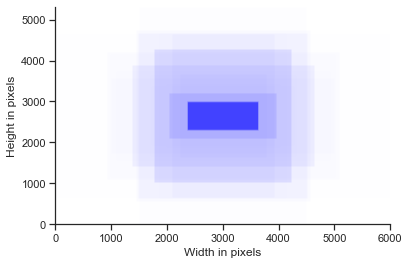

In [74]:
drawBoxes(combined)

Drawing where instances are present on resized images with 1:1 aspect ratio

In [38]:
data = kili

max_w, max_h = 1, 1

# fig, ax = plt.subplots()

# ax.add_patch(Rectangle((0,0),max_w, max_h,facecolor='#0000ff00'))
# ax.set_xlim(0, max_w)
# ax.set_ylim(0, max_h)



In [50]:
kili["annotations"][0]

{'iscrowd': 0,
 'image_id': 1,
 'bbox': [0.6937950849533081,
  0.17073695361614227,
  0.017922647297382355,
  0.011738809756934643],
 'segmentation': [],
 'category_id': 2,
 'id': 1,
 'area': 0}

In [127]:
from matplotlib.patches import Rectangle
def drawInstanceDensity(data, stop=False):
    i = 0
    j = 0

    ax = plt.gca()

    ax.add_patch(Rectangle((0,0), 1, 1,facecolor='#0000ff00'))
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    while i < len(data["images"]) :
        if stop and j>14971:
            break
        image = data["images"][i]
        h, w = image["height"], image["width"]

        while (j < len(data["annotations"]) 
               and data["annotations"][j]["image_id"] == image["id"]):
            if  len(data["annotations"][j]["bbox"]) != 4:
                j += 1
                continue
            bx, by, bw, bh = data["annotations"][j]["bbox"]
            if w != 0 and h != 0:
                ax.add_patch(Rectangle((bx/w, by/h),
                                       bw/w,
                                       by/h, 
                                       facecolor='#5471AB',
                                      alpha=0.05) )
            j += 1
        i += 1
        
    plt.xlabel("Width")
    plt.ylabel("Height")
    seaborn.despine(ax=ax, offset=0);


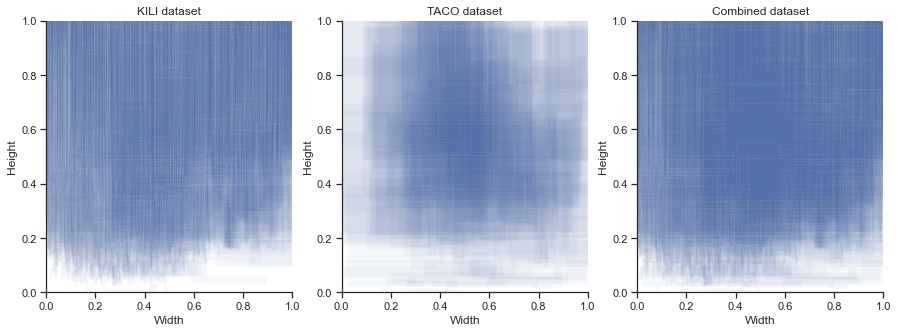

In [133]:
#kili
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title("KILI dataset")
drawInstanceDensity(combined, stop=True)

plt.subplot(1, 3, 2)
plt.title("TACO dataset")
drawInstanceDensity(taco)

plt.subplot(1, 3, 3)
plt.title("Combined dataset")
drawInstanceDensity(combined)

plt.savefig("Figs/fig4.png", bbox_inches="tight")

In [131]:
plt.

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

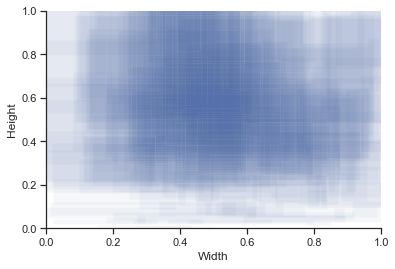

In [128]:
drawInstanceDensity(taco)

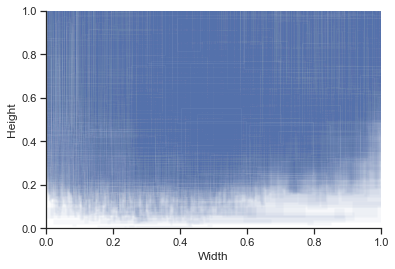

In [129]:
drawInstanceDensity(combined)

# Baseling YOLOv5 for bottles

- How accurate is it?
- What kind of examples are failing?

In [64]:
import torch

model = torch.hub.load('ultralytics/yolov5', 'yolov5s')

Using cache found in C:\Users\Ankush/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2023-6-26 Python-3.9.12 torch-2.0.1+cpu CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 


metrics to calculate:
- accuracy for plastic bottles
- mean IOU for detection

In [89]:
def predBottle(img):
    # img = io.imread(image_path)
    
    preds = model(img)
    
    preds = preds.pandas().xywh[0]
    
    preds = preds[preds.name == "bottle"]
    
    return preds

faster image loading with keras  
https://machinelearningmastery.com/how-to-load-large-datasets-from-directories-for-deep-learning-with-keras/

In [84]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [87]:
datagen = ImageDataGenerator()
datagen.flow_from_directory("TACO/data/")

Found 1485 images belonging to 16 classes.


In [88]:
for i in datagen.flow_from_directory("TACO/data/"):
    print(i)
    break

Found 1485 images belonging to 16 classes.
(array([[[[        147,         125,         114],
         [        178,         156,         145],
         [        208,         172,         146],
         ...,
         [         59,          82,          90],
         [         72,          88,         101],
         [         59,          76,          84]],

        [[        133,         114,         100],
         [        154,         135,         121],
         [        211,         182,         164],
         ...,
         [         80,         100,         109],
         [         84,         103,         110],
         [         60,          79,          86]],

        [[        132,         116,         101],
         [        143,         127,         112],
         [        169,         146,         128],
         ...,
         [         57,          77,          86],
         [         69,          87,          99],
         [         78,          96,         108]],

        

In [90]:
# this turned out to be much more slower
data = taco
folder = "TACO/data"
predictions = {}
i = 1
for img in datagen.flow_from_directory("TACO/data/"):
    preds =  predBottle(img)
    for _, pred in preds.iterrows():
        predictions[image["id"]] = (predictions.get(image["id"], []) 
                                    +
                                    [pred.xcenter-pred.width/2, 
                                    pred.ycenter-pred.height/2,
                                    pred.width,
                                    pred.height])
    print(f"Image: {i}", end="\r")
    i+=1
print(predictions)

Found 1485 images belonging to 16 classes.


KeyboardInterrupt: 

In [101]:
data = combined
predictions = {}
found_instances = 0
for i, image in enumerate(data["images"]):
    preds =  predBottle(f'{image["file_name"]}')
    predictions[image["id"]] = []
    for _, pred in preds.iterrows():
        predictions[image["id"]] = (predictions.get(image["id"], []) 
                                    +
                                    [[pred.xcenter-pred.width/2, 
                                    pred.ycenter-pred.height/2,
                                    pred.width,
                                    pred.height]])
        found_instances += 1
    print(f"Image: {i}", end="\r")
print(predictions)

FileNotFoundError: [Errno 2] No such file or directory: 'TACO/data/batch_9/000076.jpg'

In [102]:
predictions

{1: [],
 2: [],
 3: [],
 4: [],
 5: [],
 6: [],
 7: [],
 8: [],
 9: [],
 10: [],
 11: [],
 12: [],
 13: [],
 14: [],
 15: [],
 16: [],
 17: [],
 18: [],
 19: [],
 20: [],
 21: [],
 22: [],
 23: [],
 24: [],
 25: [],
 26: [],
 27: [],
 28: [],
 29: [],
 30: [],
 31: [],
 32: [],
 33: [],
 34: [],
 35: [],
 36: [],
 37: [],
 38: [],
 39: [],
 40: [],
 41: [],
 42: [],
 43: [],
 44: [],
 45: [],
 46: [],
 47: [],
 48: [],
 49: [],
 50: [],
 51: [],
 52: [],
 53: [],
 54: [],
 55: [],
 56: [],
 57: [],
 58: [],
 59: [],
 60: [],
 61: [],
 62: [],
 63: [],
 64: [],
 65: [],
 66: [],
 67: [],
 68: [],
 69: [],
 70: [],
 71: [],
 72: [],
 73: [],
 74: [],
 75: [],
 76: [],
 77: [],
 78: [],
 79: [],
 80: [],
 81: [],
 82: [],
 83: [],
 84: [],
 85: [[611.7625732421875,
   508.46636962890625,
   169.55126953125,
   130.7509765625]],
 86: [],
 87: [],
 88: [],
 89: [],
 90: [],
 91: [],
 92: [],
 93: [],
 94: [],
 95: [],
 96: [],
 97: [],
 98: [],
 99: [],
 100: [],
 101: [],
 102: [],
 103: [

In [110]:
# detected bottles
detected_bottles = sum([len(i) for i in predictions.values()])
detected_bottles

192

In [109]:
# actual bottle count
actual_bottles = 0
for annotation in data["annotations"]:
    if annotation["category_id"] == 1:
        actual_bottles += 1

actual_bottles

7930

In [112]:
detected_bottles/actual_bottles*100

2.421185372005044

In [103]:
import json

In [ ]:
json.dump(predictions, open("yolo_preds.json", "w"))

# Image examples

4 x 8 grid of images, 4 images from each dataset, KILI with bounding boxes, TACO with boxes and segmentation overlays

In [182]:
combined["images"][0]

{'height': 720,
 'width': 1280,
 'id': 1,
 'file_name': 'KILI_COCO/batch_1/000001.jpg'}

In [235]:
# cv2 to draw that on images
combined["images"][0]

def getAnnotations(image_id, combined=combined):
    i = image_id-1
    annotations = []
    while i < len(combined["annotations"]) and combined["annotations"][i]["image_id"] <= image_id:
        if image_id == combined["annotations"][i]["image_id"]:
            annotations.append(combined["annotations"][i])
        i+=1
    return annotations

In [205]:
getAnnotations(2)

[{'iscrowd': 0,
  'image_id': 2,
  'bbox': [988, 493, 34, 22],
  'segmentation': [],
  'category_id': 1,
  'id': 3,
  'area': 748},
 {'iscrowd': 0,
  'image_id': 2,
  'bbox': [477, 451, 13, 10],
  'segmentation': [],
  'category_id': 2,
  'id': 4,
  'area': 130},
 {'iscrowd': 0,
  'image_id': 2,
  'bbox': [557.0, 447.0, 8.0, 8.0],
  'segmentation': [],
  'category_id': 2,
  'id': 5,
  'area': 64},
 {'iscrowd': 0,
  'image_id': 2,
  'bbox': [602.0, 450.0, 12.0, 7.0],
  'segmentation': [],
  'category_id': 2,
  'id': 6,
  'area': 84}]

In [198]:
combined["annotations"][:10]

[{'iscrowd': 0,
  'image_id': 1,
  'bbox': [877.0, 119.0, 23.0, 8.0],
  'segmentation': [],
  'category_id': 2,
  'id': 1,
  'area': 184},
 {'iscrowd': 0,
  'image_id': 1,
  'bbox': [700, 127, 28, 7],
  'segmentation': [],
  'category_id': 2,
  'id': 2,
  'area': 196},
 {'iscrowd': 0,
  'image_id': 2,
  'bbox': [988, 493, 34, 22],
  'segmentation': [],
  'category_id': 1,
  'id': 3,
  'area': 748},
 {'iscrowd': 0,
  'image_id': 2,
  'bbox': [477, 451, 13, 10],
  'segmentation': [],
  'category_id': 2,
  'id': 4,
  'area': 130},
 {'iscrowd': 0,
  'image_id': 2,
  'bbox': [557.0, 447.0, 8.0, 8.0],
  'segmentation': [],
  'category_id': 2,
  'id': 5,
  'area': 64},
 {'iscrowd': 0,
  'image_id': 2,
  'bbox': [602.0, 450.0, 12.0, 7.0],
  'segmentation': [],
  'category_id': 2,
  'id': 6,
  'area': 84},
 {'iscrowd': 0,
  'image_id': 3,
  'bbox': [1153.0, 492.0, 53.0, 27.0],
  'segmentation': [],
  'category_id': 1,
  'id': 7,
  'area': 1431},
 {'iscrowd': 0,
  'image_id': 3,
  'bbox': [154.0

In [220]:
len(combined["annotations"])

15185

In [6]:
import cv2

In [280]:
l =  taco["annotations"][0]["segmentation"][0]
list(zip(l[::2], l[1::2]))

[(561.0, 1238.0),
 (568.0, 1201.0),
 (567.0, 1175.0),
 (549.0, 1127.0),
 (538.0, 1089.0),
 (519.0, 1043.0),
 (517.0, 1005.0),
 (523.0, 964.0),
 (529.0, 945.0),
 (520.0, 896.0),
 (525.0, 862.0),
 (536.0, 821.0),
 (554.0, 769.0),
 (577.0, 727.0),
 (595.0, 678.0),
 (596.0, 585.0),
 (588.0, 346.0),
 (581.0, 328.0),
 (569.0, 306.0),
 (570.0, 276.0),
 (576.0, 224.0),
 (560.0, 205.0),
 (564.0, 170.0),
 (578.0, 154.0),
 (608.0, 136.0),
 (649.0, 127.0),
 (688.0, 127.0),
 (726.0, 129.0),
 (759.0, 141.0),
 (784.0, 153.0),
 (792.0, 177.0),
 (788.0, 193.0),
 (782.0, 209.0),
 (792.0, 238.0),
 (802.0, 271.0),
 (802.0, 294.0),
 (791.0, 319.0),
 (789.0, 360.0),
 (794.0, 395.0),
 (810.0, 529.0),
 (819.0, 609.0),
 (841.0, 675.0),
 (882.0, 728.0),
 (916.0, 781.0),
 (928.0, 802.0),
 (938.0, 834.0),
 (940.0, 856.0),
 (939.0, 873.0),
 (938.0, 884.0),
 (944.0, 901.0),
 (951.0, 917.0),
 (956.0, 942.0),
 (960.0, 972.0),
 (964.0, 1013.0),
 (959.0, 1036.0),
 (952.0, 1081.0),
 (952.0, 1106.0),
 (934.0, 1163.0),
 (

In [370]:
def drawBoundingBoxes(image, annotations, segMask=False,t=2,alpha=.5):
    image = image.copy()
    for a in annotations:
        a["bbox"] = [int(i) for i in a["bbox"]]
        image = cv2.rectangle(image, 
                              ((a["bbox"][0]), a["bbox"][1]), 
                              (a["bbox"][0]+a["bbox"][2], a["bbox"][1]+a["bbox"][3]),
                              color=(255,255,0),
                              thickness=t)
        if segMask:
            l = [int(i) for i in a["segmentation"][0]]
            pts = np.array(list(zip(l[::2], l[1::2])), np.int32)
            pts2 = pts.reshape((-1, 1, 2))
            # image = cv2.polylines(image , [pts2], True, color=(255, 0 ,0), thickness=t+20)
            overlay = cv2.fillPoly(image.copy() , [pts2], color=(0,255,255),)
            image = cv2.addWeighted(overlay, alpha, image, 1 - alpha, 0)
            
        
    return image

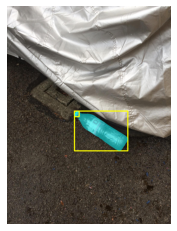

In [369]:
img_data = taco["images"][2]
img = drawBoundingBoxes(cv2.cvtColor(cv2.imread("TACO/data/"+img_data["file_name"]), cv2.COLOR_BGR2RGB),
                        getAnnotations(img_data["id"], combined=taco),
                       t=10, segMask=True, alpha=0.5)
plt.axis("off")
plt.imshow(img)

In [233]:
# cv.(combined["images"][-100]["file_name"]))
getAnnotations(img_data["id"])

[]

In [293]:
import numpy as np
pts = np.array([[25, 70], [25, 160],
                [110, 200], [200, 160],
                [200, 70], [110, 20]],
               np.int32)
 
pts = pts.reshape((-1, 1, 2))
pts

array([[[ 25,  70]],

       [[ 25, 160]],

       [[110, 200]],

       [[200, 160]],

       [[200,  70]],

       [[110,  20]]])

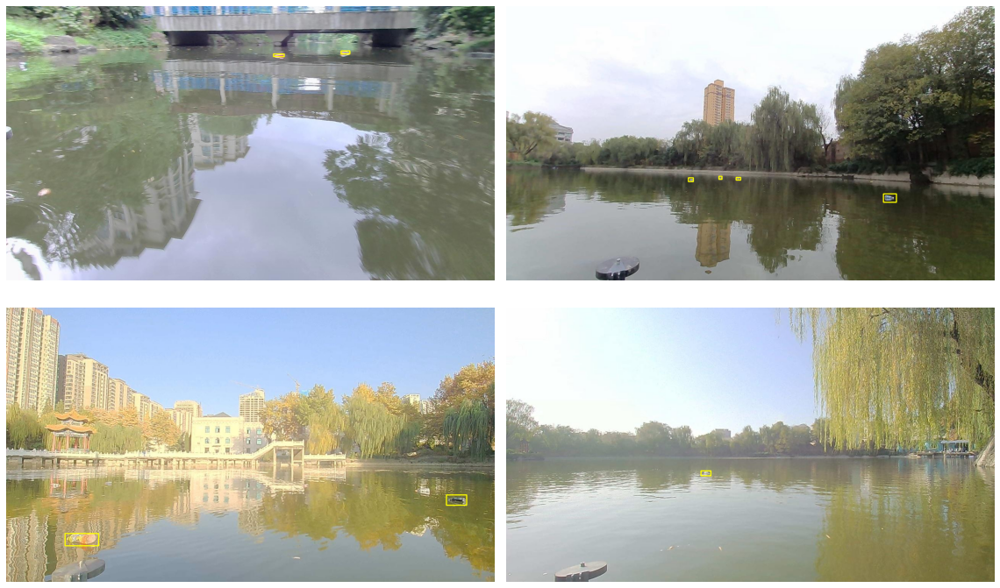

In [377]:
plt.figure(figsize=(16, 10))

for i in range(4):
    img_data = combined["images"][i]
    img = drawBoundingBoxes(cv2.cvtColor(cv2.imread(img_data["file_name"]), cv2.COLOR_BGR2RGB),
                            getAnnotations(img_data["id"]))
    plt.subplot(2, 2, i+1)
    plt.axis("off")
    plt.imshow(img)
    
plt.tight_layout()
plt.savefig("Figs/fig6.png")

In [258]:
(taco["images"][2]["file_name"])

'batch_1/000010.jpg'

In [271]:
taco["annotations"][0]

{'id': 1,
 'image_id': 0,
 'category_id': 6,
 'segmentation': [[561.0,
   1238.0,
   568.0,
   1201.0,
   567.0,
   1175.0,
   549.0,
   1127.0,
   538.0,
   1089.0,
   519.0,
   1043.0,
   517.0,
   1005.0,
   523.0,
   964.0,
   529.0,
   945.0,
   520.0,
   896.0,
   525.0,
   862.0,
   536.0,
   821.0,
   554.0,
   769.0,
   577.0,
   727.0,
   595.0,
   678.0,
   596.0,
   585.0,
   588.0,
   346.0,
   581.0,
   328.0,
   569.0,
   306.0,
   570.0,
   276.0,
   576.0,
   224.0,
   560.0,
   205.0,
   564.0,
   170.0,
   578.0,
   154.0,
   608.0,
   136.0,
   649.0,
   127.0,
   688.0,
   127.0,
   726.0,
   129.0,
   759.0,
   141.0,
   784.0,
   153.0,
   792.0,
   177.0,
   788.0,
   193.0,
   782.0,
   209.0,
   792.0,
   238.0,
   802.0,
   271.0,
   802.0,
   294.0,
   791.0,
   319.0,
   789.0,
   360.0,
   794.0,
   395.0,
   810.0,
   529.0,
   819.0,
   609.0,
   841.0,
   675.0,
   882.0,
   728.0,
   916.0,
   781.0,
   928.0,
   802.0,
   938.0,
   834.0,
   940.0,
  

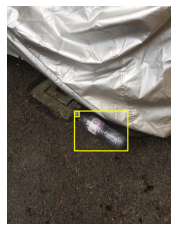

In [304]:
img_data = taco["images"][2]
img = drawBoundingBoxes(cv2.cvtColor(cv2.imread("TACO/data/"+img_data["file_name"]), cv2.COLOR_BGR2RGB),
                        getAnnotations(img_data["id"], combined=taco),
                       t=10, segMask=True)
plt.axis("off")
plt.imshow(img)

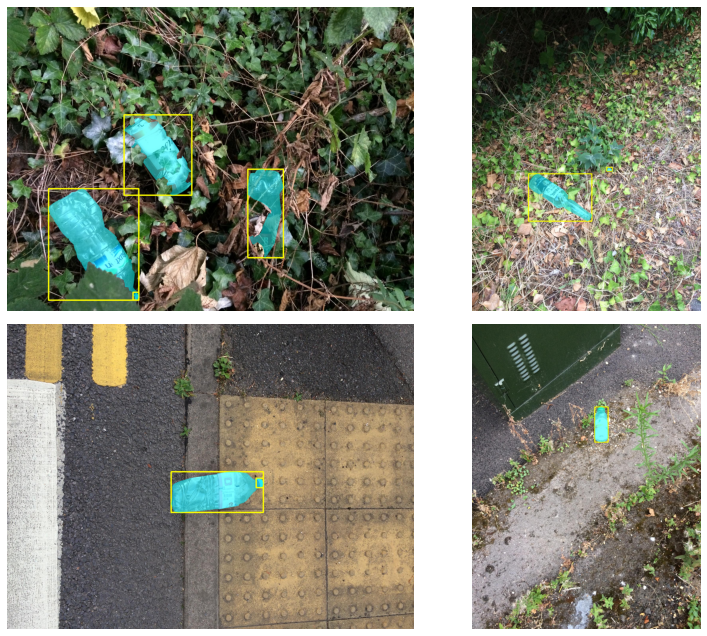

In [379]:
plt.figure(figsize=(11.5, 9))

for j, i in enumerate([3,10,7,8]):
    img_data = taco["images"][i]
    img = drawBoundingBoxes(cv2.cvtColor(cv2.imread("TACO/data/"+img_data["file_name"]), cv2.COLOR_BGR2RGB),
                            getAnnotations(img_data["id"], combined=taco),
                           t=5, segMask=True)
    plt.subplot(2, 2, j+1)
    plt.axis("off")
    plt.imshow(img)
    
plt.tight_layout()
plt.savefig("Figs/fig7.png", bbox_inches="tight")

Color histograms

In [11]:
import numpy as np

In [14]:
hists[0]

{0: array([   273,     80,     78,    107,    115,    156,    200,    274,
           369,    504,    718,   1074,   1431,   1687,   2105,   2554,
          3325,   3607,   3706,   3793,   3902,   3798,   3830,   4190,
          4446,   4917,   5813,   5982,   6856,   7358,   7477,   7413,
          7202,   6651,   5959,   5513,   5478,   5365,   5423,   5645,
          5493,   5420,   5624,   5491,   5406,   5579,   5581,   5828,
          5726,   5913,   5933,   5966,   6263,   6313,   6489,   6790,
          6756,   6570,   6587,   6501,   6475,   6323,   6046,   5863,
          5606,   5412,   5445,   5166,   5073,   4870,   4922,   4932,
          4963,   4962,   4885,   4950,   4924,   4723,   4588,   4557,
          4479,   4423,   4237,   4226,   4080,   3739,   3624,   3575,
          3369,   3219,   3185,   3165,   3042,   3055,   2945,   2822,
          2674,   2668,   2607,   2505,   2500,   2424,   2299,   2187,
          2095,   1991,   1883,   1809,   1774,   1655,   163

In [23]:
img[:, :, 0].reshape(-1)

array([125, 126, 126, ..., 172, 166, 169], dtype=uint8)

In [26]:
from random import random

In [29]:
random()

0.08746717386106861

In [57]:
image["file_name"]

'batch_10/004259.jpg'

In [63]:
hists_comb = [{i: 0 for i in range(256)} for _ in range(3)]


data = combined

for idx, image in enumerate(data["images"]):
    if random() < 0.90:
        continue
    print(f"Image: {idx}", end="\r")
    img = cv2.imread(image["file_name"]) # BGR
    if img is None:
        continue
    for i in range(3):
        u, c = np.unique(img[:, :, i], return_counts=True)
        for j, a in zip(u, c):
            hists_comb[i][j] += a 
            
    del img

hists_comb

[{0: 12336512,
  1: 2778936,
  2: 3056692,
  3: 3188608,
  4: 3523138,
  5: 3711309,
  6: 3875331,
  7: 4117902,
  8: 4323613,
  9: 4609874,
  10: 4740623,
  11: 4873512,
  12: 4957820,
  13: 4999504,
  14: 5076115,
  15: 5176107,
  16: 5297348,
  17: 5418034,
  18: 5564764,
  19: 5725247,
  20: 5879863,
  21: 6041622,
  22: 6185064,
  23: 6318138,
  24: 6449284,
  25: 6579941,
  26: 6709152,
  27: 6846589,
  28: 7177924,
  29: 7204047,
  30: 7318958,
  31: 7458841,
  32: 7521918,
  33: 7614668,
  34: 7724109,
  35: 7815756,
  36: 7933583,
  37: 8024950,
  38: 8137453,
  39: 8210613,
  40: 8290826,
  41: 8377568,
  42: 8441481,
  43: 8500266,
  44: 8574031,
  45: 8641444,
  46: 8722601,
  47: 8760589,
  48: 8762244,
  49: 8746356,
  50: 8717234,
  51: 8705079,
  52: 8730946,
  53: 8726121,
  54: 8683556,
  55: 8639869,
  56: 8591617,
  57: 8518421,
  58: 8508406,
  59: 8539037,
  60: 8574200,
  61: 8550421,
  62: 8527412,
  63: 8472736,
  64: 8427939,
  65: 8425164,
  66: 8498859,
  67

In [37]:
import seaborn as sns

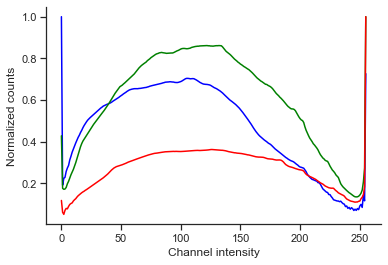

In [78]:
def color_plot(hists):
    x = list(range(256))
    for i in range(3):
        maximum = max(list(hists[i].values()))
        plt.plot(x, np.array(list(hists[i].values()))/maximum, color=["blue","green","red"][i])
        plt.xlabel("Channel intensity")
        plt.ylabel("Normalized counts")
        
    # plt.legend(["Blue", "Green", "Red"])
    seaborn.despine(ax=plt.gca(), offset=0);
    
color_plot(hists)

18105902
11416775
7645560


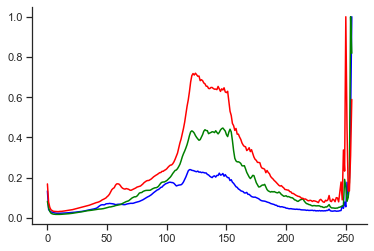

In [61]:
color_plot(hists_kili)

27190905
16634959
20446721


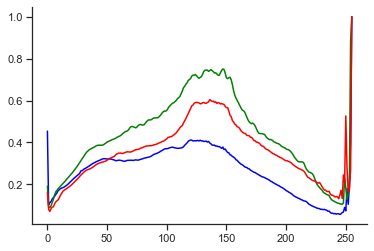

In [64]:
color_plot(hists_comb)

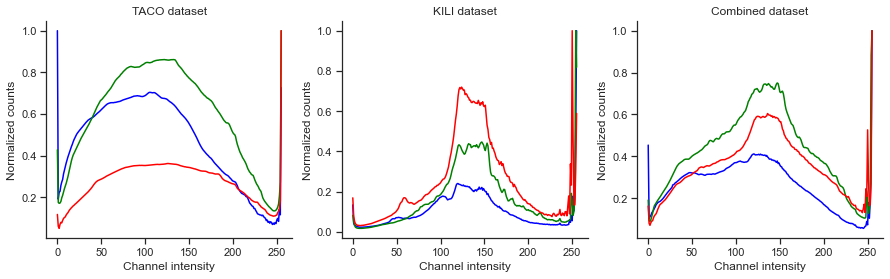

In [79]:
plt.figure(figsize=(15, 4))
plt.subplot(1, 3, 1)
plt.title("TACO dataset")
color_plot(hists)

plt.subplot(1, 3, 2)
plt.title("KILI dataset")
color_plot(hists_kili)

plt.subplot(1, 3, 3)
plt.title("Combined dataset")
color_plot(hists_comb)

plt.savefig("Figs/fig8.png")

As shown in Figure 8, we find that green is the dominant channel for TACO dataset whereas red for KILI dataset with stronger peaks. The combined dataset green as strongest channel, which indicates that color correction like histogram normalization for channels could be used to improve information distribution in image channels.